# Segmentation demo

This excercise is based on the excelent collab notebook: 
https://colab.research.google.com/github/daveluo/zanzibar-aerial-mapping/blob/master/geo_fastai_tutorial01_public_v1.ipynb#scrollTo=avIXcLzdsYem

by https://github.com/daveluo

We follow all the steps of the original notebook. Only differences are added explanations and some code cleanups.


NEW LIBS:

    - geopandas
    - rasterio [also: conda install libiconv]
    - supermercado [pip]
    - rio_tiler [pip]
    - solaris [pip], rtree/ gdal=2.4.1 from conda-forge
    

In [3]:
#!pip install supermercado
#!pip install rio-tiler
#!pip install solaris

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [38]:
import geopandas as gpd
import matplotlib.pylab as plt
import numpy as np
import pandas as pd
from pathlib import Path
import rasterio
from rasterio.transform import from_bounds
from rio_tiler import main as rt_main
from shapely.geometry import Polygon
from shapely.ops import cascaded_union
import skimage
import solaris as sol
from tqdm import tqdm_notebook as tqdm

In [3]:
# setup the folders
data_dir = Path('segmentation_data')
data_dir.mkdir(exist_ok=True)
img_path = data_dir/'images-256'
mask_path = data_dir/'masks-256'
img_path.mkdir(exist_ok=True)
mask_path.mkdir(exist_ok=True)

In [4]:
tif_url = 'http://oin-hotosm.s3.amazonaws.com/5afeda152b6a08001185f11a/0/5afeda152b6a08001185f11b.tif'
geojson_url = 'https://www.dropbox.com/sh/ct3s1x2a846x3yl/AAARCAOqhcRdoU7ULOb9GJl9a/grid_001.geojson?dl=1'

In [5]:
rasterio.open(tif_url).meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 37113,
 'height': 34306,
 'count': 3,
 'crs': CRS.from_epsg(32737),
 'transform': Affine(0.0774800032377243, 0.0, 531847.0,
        0.0, -0.0774800032377243, 9367848.0)}

In [6]:
# load geojson for znz001 labels
label_df = gpd.read_file(geojson_url)
label_df = label_df[~label_df['geometry'].isna()] # remove empty rows

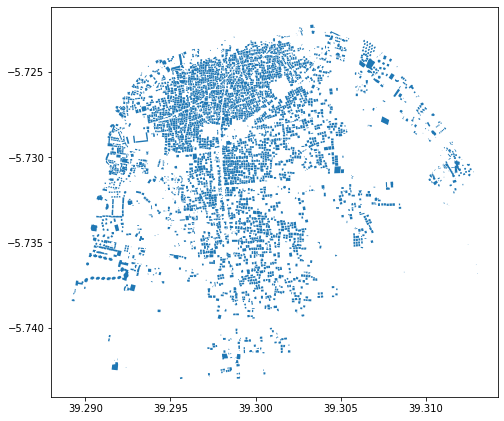

In [7]:
label_df.plot(figsize=(8,8));

### Explanation:
Since we are working with a single image, we need to delineate what sub-areas of the image and labels should be used as training versus validation data for model training.


In [16]:
# download pre-made AOI geojson file:
! wget -O aoi.geojson https://www.dropbox.com/s/ojyjvvoer5guadr/znz001_trnval2.geojson?dl=1

--2019-08-19 10:07:37--  https://www.dropbox.com/s/ojyjvvoer5guadr/znz001_trnval2.geojson?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.66.1, 2620:100:6022:1::a27d:4201
Connecting to www.dropbox.com (www.dropbox.com)|162.125.66.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/dl/ojyjvvoer5guadr/znz001_trnval2.geojson [following]
--2019-08-19 10:07:37--  https://www.dropbox.com/s/dl/ojyjvvoer5guadr/znz001_trnval2.geojson
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucbde193e6cb0848c1125f978b69.dl.dropboxusercontent.com/cd/0/get/Am6OTYk9tQXfz9cTZN1K4RsR653yG_-kcz4M3SlqCy63XrS5Pvli6qjeT5ESJGZrm3KECxg6BYs5NiLdUfL4mymvtrQagTnURX1wQEATOA8qIQ/file?dl=1# [following]
--2019-08-19 10:07:38--  https://ucbde193e6cb0848c1125f978b69.dl.dropboxusercontent.com/cd/0/get/Am6OTYk9tQXfz9cTZN1K4RsR653yG_-kcz4M3SlqCy63XrS5Pvli6qjeT5ESJGZrm3KECxg6BYs5NiLdUfL4mymvtrQagTnURX1w

In [8]:
tile_size = 256
zoom_level = 19   # z19: 30cm px, z20: 15cm px, z21: 7.5cm px

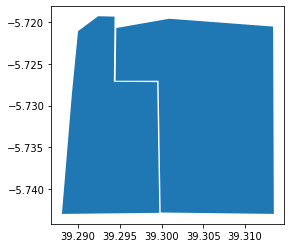

In [9]:
aoi_df = gpd.read_file('aoi.geojson')
aoi_df.plot();

In [10]:
# split into different files
aoi_df[aoi_df['dataset']=='trn']['geometry'].to_file('trn_aoi.geojson', driver='GeoJSON')
aoi_df[aoi_df['dataset']=='val']['geometry'].to_file('val_aoi.geojson', driver='GeoJSON')

In [11]:
# burn tiles with supermercard
# see https://github.com/mapbox/supermercado#supermercado-burn
!cat trn_aoi.geojson | supermercado burn {zoom_level} | mercantile shapes | fio collect > trn_aoi_z{zoom_level}tiles.geojson
!cat val_aoi.geojson | supermercado burn {zoom_level} | mercantile shapes | fio collect > val_aoi_z{zoom_level}tiles.geojson

In [12]:
trn_tiles = gpd.read_file(f'trn_aoi_z{zoom_level}tiles.geojson')
val_tiles = gpd.read_file(f'val_aoi_z{zoom_level}tiles.geojson')
trn_tiles['dataset'] = 'trn'
val_tiles['dataset'] = 'val'

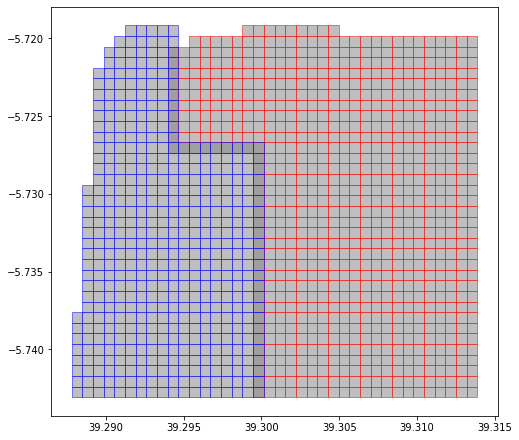

In [14]:
# see if there's overlapping tiles between trn and val
fig, ax = plt.subplots(figsize=(8,8))
trn_tiles.plot(ax=ax, color='grey', alpha=0.5, edgecolor='red')
val_tiles.plot(ax=ax, color='grey', alpha=0.5, edgecolor='blue');

In [15]:
# merge into one gdf to keep all trn tiles while dropping overlapping/duplicate val tiles
tiles_gdf = gpd.GeoDataFrame(pd.concat([trn_tiles, val_tiles], ignore_index=True), crs=trn_tiles.crs)
tiles_gdf.drop_duplicates(subset=['id'], inplace=True)

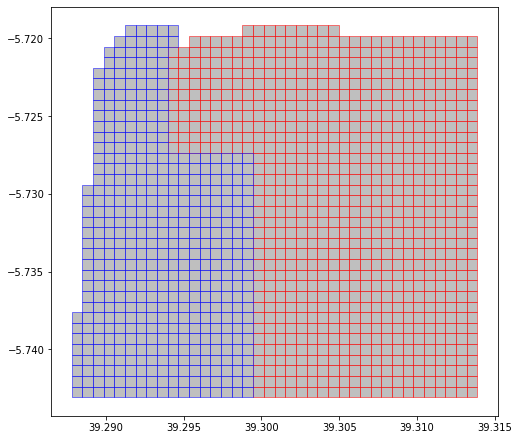

In [16]:
# check that there's no more overlapping tiles between trn and val
fig, ax = plt.subplots(figsize=(8,8))
tiles_gdf[tiles_gdf['dataset'] == 'trn'].plot(ax=ax, color='grey', edgecolor='red', alpha=0.5)
tiles_gdf[tiles_gdf['dataset'] == 'val'].plot(ax=ax, color='grey', edgecolor='blue', alpha=0.5);

In [17]:
tiles_gdf.head()

,id,title,geometry,dataset
0,"(319377, 270487, 19)","XYZ tile (319377, 270487, 19)",POLYGON ((39.29878234863281 -5.719845659536206...,trn
1,"(319378, 270487, 19)","XYZ tile (319378, 270487, 19)",POLYGON ((39.29946899414062 -5.719845659536206...,trn
2,"(319379, 270487, 19)","XYZ tile (319379, 270487, 19)",POLYGON ((39.30015563964844 -5.719845659536206...,trn
3,"(319380, 270487, 19)","XYZ tile (319380, 270487, 19)",POLYGON ((39.30084228515625 -5.719845659536206...,trn
4,"(319381, 270487, 19)","XYZ tile (319381, 270487, 19)",POLYGON ((39.30152893066406 -5.719845659536206...,trn


In [18]:
# convert 'id' string to list of ints for z,x,y
def reformat_xyz(tile_gdf):
    tile_gdf['xyz'] = tile_gdf.id.apply(lambda x: x.lstrip('(,)').rstrip('(,)').split(','))
    tile_gdf['xyz'] = [[int(q) for q in p] for p in tile_gdf['xyz']]
    return tile_gdf

In [19]:
tiles_gdf = reformat_xyz(tiles_gdf)
tiles_gdf.head()

,id,title,geometry,dataset,xyz
0,"(319377, 270487, 19)","XYZ tile (319377, 270487, 19)",POLYGON ((39.29878234863281 -5.719845659536206...,trn,"[319377, 270487, 19]"
1,"(319378, 270487, 19)","XYZ tile (319378, 270487, 19)",POLYGON ((39.29946899414062 -5.719845659536206...,trn,"[319378, 270487, 19]"
2,"(319379, 270487, 19)","XYZ tile (319379, 270487, 19)",POLYGON ((39.30015563964844 -5.719845659536206...,trn,"[319379, 270487, 19]"
3,"(319380, 270487, 19)","XYZ tile (319380, 270487, 19)",POLYGON ((39.30084228515625 -5.719845659536206...,trn,"[319380, 270487, 19]"
4,"(319381, 270487, 19)","XYZ tile (319381, 270487, 19)",POLYGON ((39.30152893066406 -5.719845659536206...,trn,"[319381, 270487, 19]"


#### Load slippy map tile image from COG with rio-tiler and corresponding label with geopandas

Now we'll use [rio-tiler](https://github.com/cogeotiff/rio-tiler) and the slippy map tile polygons generated by supermercado to test load a single 256x256 pixel tile from our znz001 COG image file. We will also load the znz001 geoJSON labels into a geopandas GeoDataFrame and crop the building geometries to only those that intersect the bounds of the tile image.

Here is a great intro to COGs, rio-tiler, and exciting developments in the cloud-native geospatial toolbox by [Vincent Sarago](https://medium.com/@_VincentS_) of [Development Seed](https://developmentseed.org/): https://medium.com/devseed/cog-talk-part-1-whats-new-941facbcd3d1

We'll then create our corresponding 3-channel RGB mask by passing these cropped geometries to solaris' df_to_px_mask function. Pixel value of 255 in the generated mask: 

in the 1st (Red) channel represent building footprints, 
in the 2nd (Green) channel represent building boundaries (visually looks yellow on the RGB mask display because the pixels overlap red and green+red=yellow), 
and in the 3rd (Blue) channel represent close contact points between adjacent buildings

In [21]:
idx = 220
tiles_gdf.iloc[idx]['xyz']

[319380, 270495, 19]

In [22]:
tile, mask = rt_main.tile(tif_url, *tiles_gdf.iloc[idx]['xyz'], tilesize=tile_size)

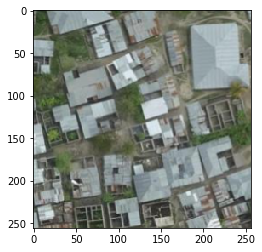

In [25]:
# change axis order for imshow
plt.imshow(np.moveaxis(tile,0,2));

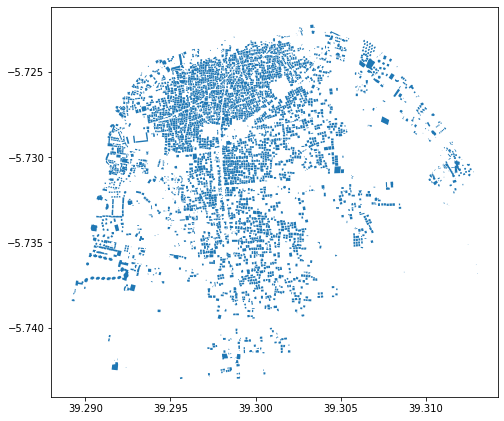

In [26]:
# redisplay our labeled geojson file
label_df.plot(figsize=(8,8));

In [28]:
# get the geometries from the geodataframe
all_polys = label_df.geometry

In [29]:
# preemptively fix and merge any invalid or overlapping geoms that would otherwise throw errors during the rasterize step. 
# TODO: probably a better way to do this

# https://gis.stackexchange.com/questions/271733/geopandas-dissolve-overlapping-polygons
# https://nbviewer.jupyter.org/gist/rutgerhofste/6e7c6569616c2550568b9ce9cb4716a3

def explode(gdf):
    """    
    Will explode the geodataframe's muti-part geometries into single 
    geometries. Each row containing a multi-part geometry will be split into
    multiple rows with single geometries, thereby increasing the vertical size
    of the geodataframe. The index of the input geodataframe is no longer
    unique and is replaced with a multi-index. 

    The output geodataframe has an index based on two columns (multi-index) 
    i.e. 'level_0' (index of input geodataframe) and 'level_1' which is a new
    zero-based index for each single part geometry per multi-part geometry
    
    Args:
        gdf (gpd.GeoDataFrame) : input geodataframe with multi-geometries
        
    Returns:
        gdf (gpd.GeoDataFrame) : exploded geodataframe with each single 
                                 geometry as a separate entry in the 
                                 geodataframe. The GeoDataFrame has a multi-
                                 index set to columns level_0 and level_1
        
    """
    gs = gdf.explode()
    gdf2 = gs.reset_index().rename(columns={0: 'geometry'})
    gdf_out = gdf2.merge(gdf.drop('geometry', axis=1), left_on='level_0', right_index=True)
    gdf_out = gdf_out.set_index(['level_0', 'level_1']).set_geometry('geometry')
    gdf_out.crs = gdf.crs
    return gdf_out

def cleanup_invalid_geoms(all_polys):
    all_polys_merged = gpd.GeoDataFrame()
    all_polys_merged['geometry'] = gpd.GeoSeries(cascaded_union([p.buffer(0) for p in all_polys]))

    gdf_out = explode(all_polys_merged)
    gdf_out = gdf_out.reset_index()
    gdf_out.drop(columns=['level_0','level_1'], inplace=True)
    all_polys = gdf_out['geometry']
    return all_polys

all_polys = cleanup_invalid_geoms(all_polys)

In [31]:
# get the same tile polygon as our tile image above
tile_poly = tiles_gdf.iloc[idx]['geometry']
print(tile_poly.bounds)
tile_poly;

(39.30084228515625, -5.7253114476101485, 39.30152893066406, -5.724628226958752)


In [32]:
# get affine transformation matrix for this tile using rasterio.transform.from_bounds:
# https://rasterio.readthedocs.io/en/stable/api/rasterio.transform.html#rasterio.transform.from_bounds
tfm = from_bounds(*tile_poly.bounds, tile_size, tile_size) 
tfm

Affine(2.682209014892578e-06, 0.0, 39.30084228515625,
       0.0, -2.6688306695166197e-06, -5.724628226958752)

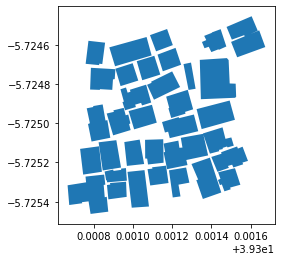

In [34]:
# crop znz001 geometries to what overlaps our tile polygon bounds
cropped_polys = [poly for poly in all_polys if poly.intersects(tile_poly)]
cropped_polys_gdf = gpd.GeoDataFrame(geometry=cropped_polys, crs={'init': 'epsg:4326'})
cropped_polys_gdf.plot();

In [35]:
# burn a footprint/boundary/contact 3-channel mask with solaris: 
# https://solaris.readthedocs.io/en/latest/tutorials/notebooks/api_masks_tutorial.html
fbc_mask = sol.vector.mask.df_to_px_mask(df=cropped_polys_gdf,
                                         channels=['footprint', 'boundary', 'contact'],
                                         affine_obj=tfm, shape=(tile_size,tile_size),
                                         boundary_width=5, boundary_type='inner', contact_spacing=5, meters=True)

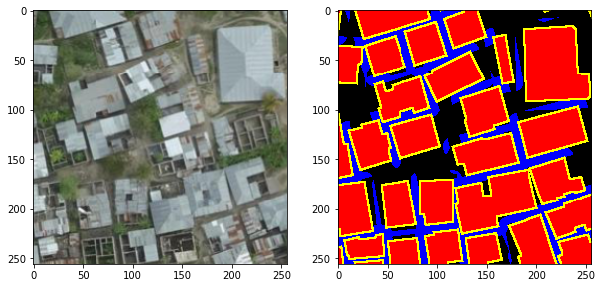

In [36]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10, 5))
ax1.imshow(np.moveaxis(tile,0,2))
ax2.imshow(fbc_mask);

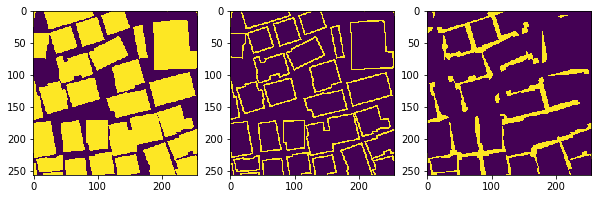

In [37]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(10, 5))
ax1.imshow(fbc_mask[:,:,0])
ax2.imshow(fbc_mask[:,:,1])
ax3.imshow(fbc_mask[:,:,2])

#### Make and save all the image and mask tiles
Now that we've successfully loaded one tile image from COG with rio-tiler and created its 3-channel RGB mask with solaris, let's generate our full training and validation datasets.

We'll write some functions and loops to run through all of our trn and val tiles at `zoom_level=19` and save them as lossless png files in the appropriate folders with a filename schema of `{save_path}/{prefix}{z}_{x}_{y}` so we can easily identify and geolocate what tile each file represents.

In [40]:
def save_tile_img(tif_url, xyz, tile_size, save_path='', prefix='', display=False):
    x,y,z = xyz
    tile, mask = rt_main.tile(tif_url, x,y,z, tilesize=tile_size)
    if display: 
        plt.imshow(np.moveaxis(tile,0,2))
        plt.show()
    
    skimage.io.imsave(f'{save_path}/{prefix}{z}_{x}_{y}.png', 
                      np.moveaxis(tile,0,2),
                      check_contrast=False) 

In [41]:
def save_tile_mask(labels_poly, tile_poly, xyz, tile_size, save_path='', prefix='', display=False):
    x,y,z = xyz
    tfm = from_bounds(*tile_poly.bounds, tile_size, tile_size) 
  
    cropped_polys = [poly for poly in labels_poly if poly.intersects(tile_poly)]
    cropped_polys_gdf = gpd.GeoDataFrame(geometry=cropped_polys, 
                                         crs={'init': 'epsg:4326'})
  
    fbc_mask = sol.vector.mask.df_to_px_mask(df=cropped_polys_gdf,
                                             channels=['footprint', 'boundary', 'contact'],
                                             affine_obj=tfm, shape=(tile_size,tile_size),
                                             boundary_width=5, boundary_type='inner', contact_spacing=5, meters=True)
  
    if display: 
        plt.imshow(fbc_mask)
        plt.show()
  
    skimage.io.imsave(f'{save_path}/{prefix}{z}_{x}_{y}_mask.png',
                      fbc_mask,
                      check_contrast=False) 

In [42]:
tiles_gdf[tiles_gdf['dataset'] == 'trn'].shape, tiles_gdf[tiles_gdf['dataset'] == 'val'].shape

((809, 5), (452, 5))

In [43]:
# we'll load our COG locally but could also load directly from url which is slower and subject to potentially more i/o issues
# TODO: try loading from url and catch i/o exceptions
# TODO: multithread/multiprocess this? Took ~3.5 mins to load and save 1261 image tiles on local COG file loading
for idx, tile in tqdm(tiles_gdf.iterrows(), total=len(tiles_gdf)):
    dataset = tile['dataset']
    save_tile_img('tmp.tif', tile['xyz'], tile_size, save_path=img_path, prefix=f'znz001{dataset}_', display=False)

In [45]:
# TODO: multiprocess this? Took ~3 mins to burn and save 1261 masks
for idx, tile in tqdm(tiles_gdf.iterrows(), total=len(tiles_gdf)):
    dataset = tile['dataset']
    tile_poly = tile['geometry']
    save_tile_mask(all_polys, tile_poly, tile['xyz'], tile_size, 
                   save_path=mask_path,
                   prefix=f'znz001{dataset}_', display=False)

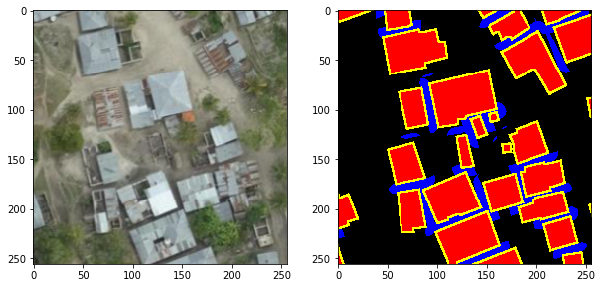

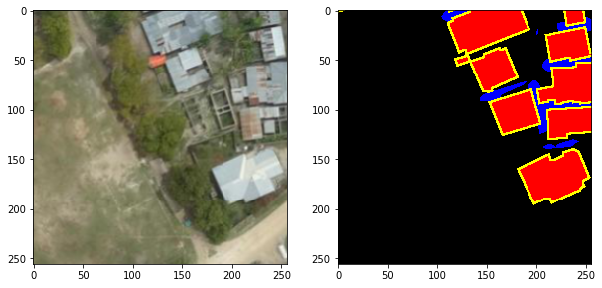

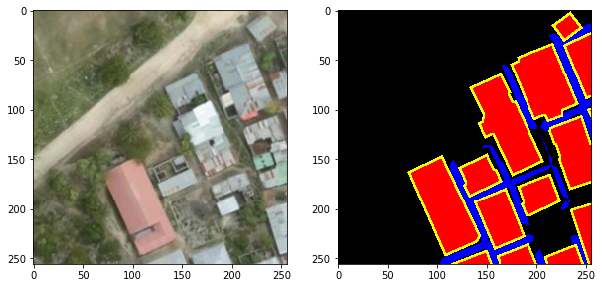

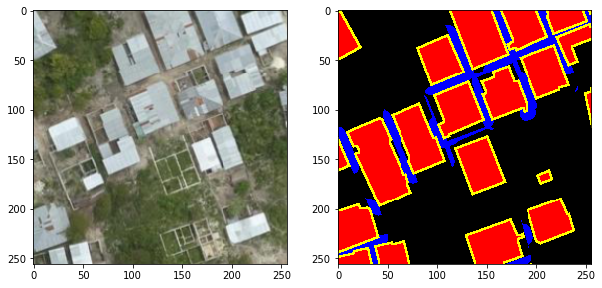

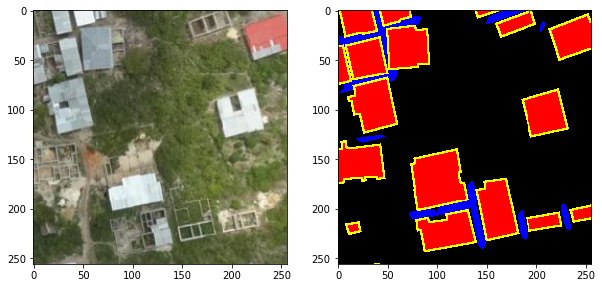

In [46]:
# check that tile images and masks saved correctly
start_idx, end_idx = 200,205
for i,j in zip(sorted(img_path.iterdir())[start_idx:end_idx], sorted(mask_path.iterdir())[start_idx:end_idx]):
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,5))
    ax1.imshow(skimage.io.imread(i))
    ax2.imshow(skimage.io.imread(j))
    plt.show();

In [47]:
# compress and download
!tar -czf znz001trn.tar.gz segmentation_data

# Model training

In [48]:
from fastai.vision import *
from fastai.callbacks import *

In [51]:
#from fastai.utils.collect_env import *
#show_install(True)

In [52]:
path = Path('segmentation_data')
path.ls()

[PosixPath('segmentation_data/masks-256'),
 PosixPath('segmentation_data/images-256')]

In [53]:
path_lbl = path/'masks-256'
path_img = path/'images-256'

In [61]:
fnames = get_image_files(path_img)
lbl_names = get_image_files(path_lbl)
print(len(fnames), len(lbl_names))
fnames[:3], lbl_names[:3] 

1261 1261


([PosixPath('segmentation_data/images-256/znz001val_19_319373_270504.png'),
  PosixPath('segmentation_data/images-256/znz001trn_19_319394_270511.png'),
  PosixPath('segmentation_data/images-256/znz001trn_19_319388_270503.png')],
 [PosixPath('segmentation_data/masks-256/znz001val_19_319363_270511_mask.png'),
  PosixPath('segmentation_data/masks-256/znz001trn_19_319388_270496_mask.png'),
  PosixPath('segmentation_data/masks-256/znz001trn_19_319386_270503_mask.png')])

In [62]:
get_y_fn = lambda x: path_lbl/f'{x.stem}_mask.png'

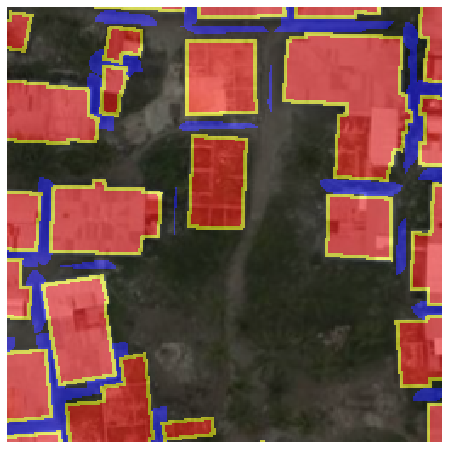

In [72]:
# test that masks are opening correctly with open_mask() settings
img_f = fnames[3]
img = open_image(img_f)
mask = open_mask(get_y_fn(img_f), convert_mode='RGB', div=False)

fig,ax = plt.subplots(1,1, figsize=(8,8))
img.show(ax=ax)
mask.show(ax=ax, alpha=0.5)

(array([159964.,      0.,  36644.]),
 array([  0.,  85., 170., 255.]),
 <a list of 3 Patch objects>)

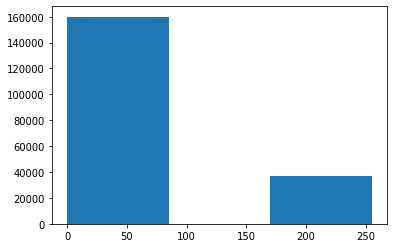

In [73]:
plt.hist(mask.data.view(-1), bins=3)

In [74]:
# define the valdation set by fn prefix
holdout_grids = ['znz001val_']
valid_idx = [i for i,o in enumerate(fnames) if any(c in str(o) for c in holdout_grids)]
print(len(valid_idx))

452


In [75]:
# subclassing SegmentationLabelList to set open_mask(fn, div=True, convert_mode='RGB') for 3 channel target masks

class SegLabelListCustom(SegmentationLabelList):
    def open(self, fn): return open_mask(fn, div=True, convert_mode='RGB')
    
class SegItemListCustom(SegmentationItemList):
    _label_cls = SegLabelListCustom

In [76]:
# the classes corresponding to each channel
codes = np.array(['Footprint','Boundary','Contact'])

In [77]:
size = 256
bs = 16

In [78]:
# define image transforms for data augmentation and create databunch. More about image tfms and data aug at https://docs.fast.ai/vision.transform.html 
tfms = get_transforms(flip_vert=True, max_warp=0.1, max_rotate=20, max_zoom=2, max_lighting=0.3)

src = (SegItemListCustom.from_folder(path_img)
        .split_by_idx(valid_idx)
        .label_from_func(get_y_fn, classes=codes))

data = (src.transform(tfms, size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats))

In [79]:
def show_3ch(imgitem, figsize=(10,5)):
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=figsize)
    ax1.imshow(np.asarray(imgitem.data[0,None])[0])
    ax2.imshow(np.asarray(imgitem.data[1,None])[0])
    ax3.imshow(np.asarray(imgitem.data[2,None])[0])
    
    ax1.set_title('Footprint')
    ax2.set_title('Boundary')
    ax3.set_title('Contact')
    
    plt.show()

znz001val_19_319374_270517.png


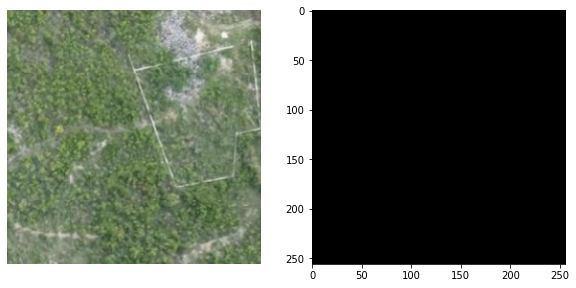

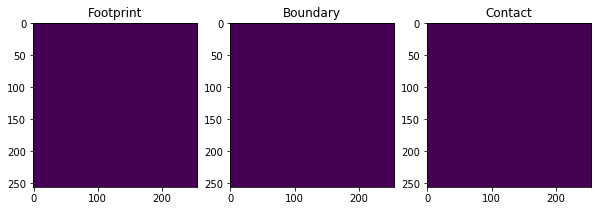

znz001val_19_319368_270496.png


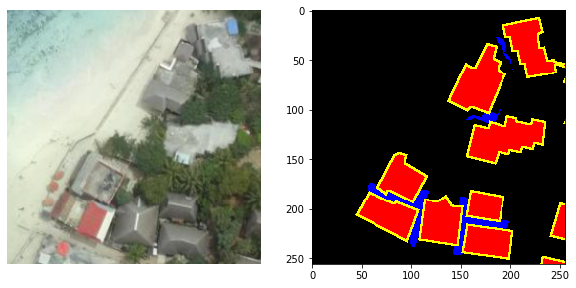

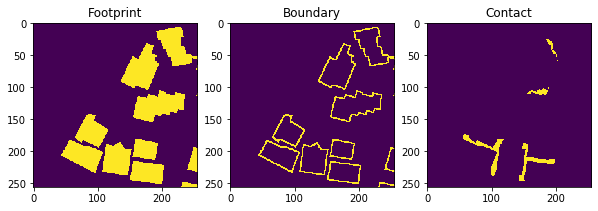

znz001val_19_319372_270507.png


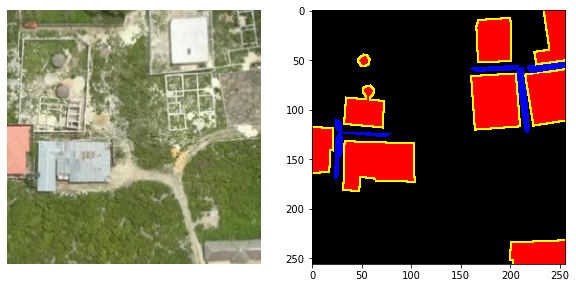

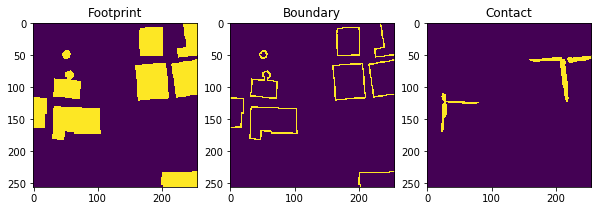

znz001val_19_319374_270505.png


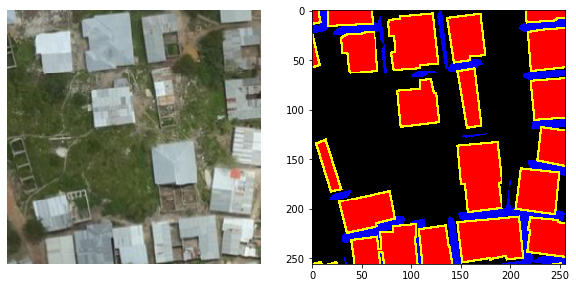

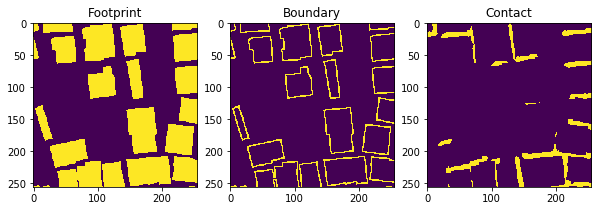

znz001val_19_319369_270520.png


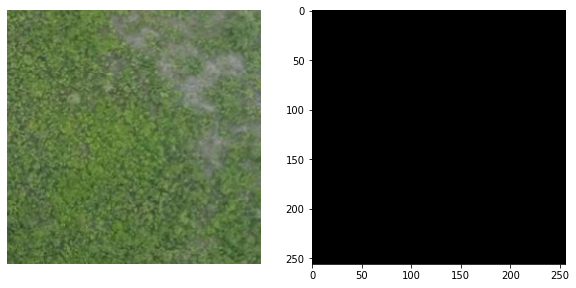

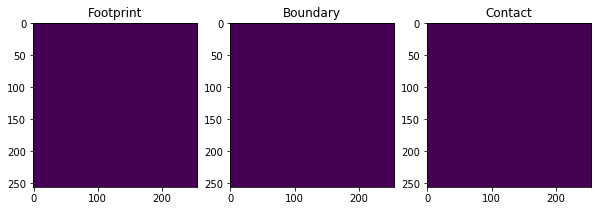

In [82]:
for idx in range(5,10):
    print(data.valid_ds.items[idx].name)
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5))
    data.valid_ds.x[idx].show(ax=ax1)
    ax2.imshow(image2np(data.valid_ds.y[idx].data*255))
    plt.show()
    show_3ch(data.valid_ds.y[idx])

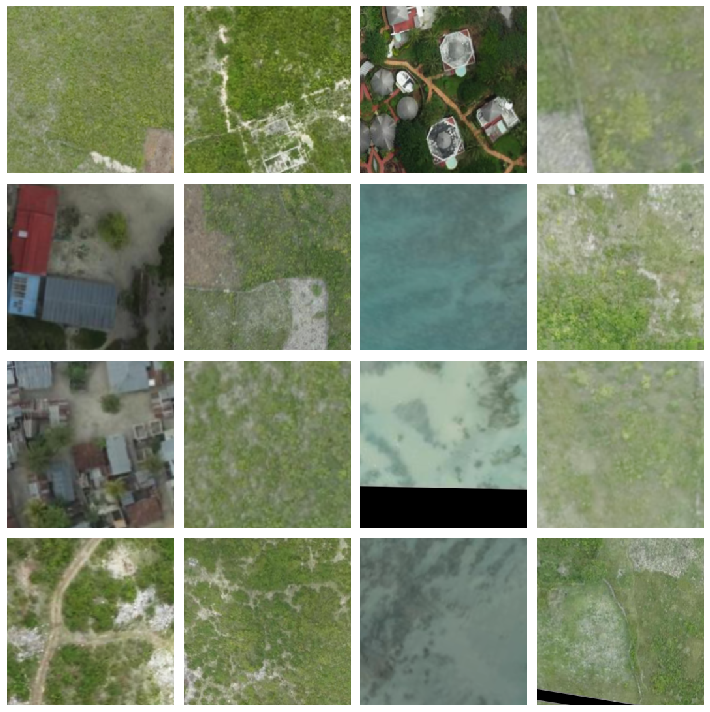

In [83]:
# visually inspect data-augmented training images
# TODO: show_batch doesn't display RGB mask correctly, setting alpha=0 to turn off for now
data.show_batch(4,figsize=(10,10), alpha=0.)

In [84]:
data

ImageDataBunch;

Train: LabelList (809 items)
x: SegItemListCustom
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegLabelListCustom
ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256)
Path: segmentation_data/images-256;

Valid: LabelList (452 items)
x: SegItemListCustom
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegLabelListCustom
ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256),ImageSegment (3, 256, 256)
Path: segmentation_data/images-256;

Test: None

#### Define custom losses and metrics to handle 3-channel targets
Here we implement some new loss functions like Dice Loss and Focal Loss which have been shown to perform well in image segmentation tasks. Then we'll create a MultiChComboLoss class to combine multiple loss functions and calculate them across the 3 channels with adjustable weighting.

The approach of combining a Dice or Jaccard loss to consider image-wide context with individual pixel-focused Binary Cross Entropy or Focal loss with adjustable weighing of the 3 target mask channels has been shown to consistently outperform single loss functions. This is well-documented by Nick Weir's deep dive into the recent [SpaceNet 4 Off-Nadir Building Detection top results](https://spacenetchallenge.github.io/datasets/spacenet-OffNadir-summary.html):

https://medium.com/the-downlinq/a-deep-dive-into-the-spacenet-4-winning-algorithms-8d611a5dfe25

Finally, we adapt our model evaluation metrics (accuracy and dice score) to calculate a mean score for all channels or by a specified individual channel.

In [94]:
import pdb

def dice_loss(input, target):
#     pdb.set_trace()
    smooth = 1.
    input = torch.sigmoid(input)
    iflat = input.contiguous().view(-1).float()
    tflat = target.contiguous().view(-1).float()
    intersection = (iflat * tflat).sum()
    return 1 - ((2. * intersection + smooth) / ((iflat + tflat).sum() +smooth))

# adapted from https://www.kaggle.com/c/tgs-salt-identification-challenge/discussion/65938
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, reduction='mean'):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets.float(), reduction='none')
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean': return F_loss.mean()
        elif self.reduction == 'sum': return F_loss.sum()
        else: return F_loss

class DiceLoss(nn.Module):
    def __init__(self, reduction='mean'):
        super().__init__()
        self.reduction = reduction
        
    def forward(self, input, target):
        loss = dice_loss(input, target)
        if self.reduction == 'mean': return loss.mean()
        elif self.reduction == 'sum': return loss.sum()
        else: return loss

class MultiChComboLoss(nn.Module):
    def __init__(self, reduction='mean', loss_funcs=[FocalLoss(),DiceLoss()], loss_wts = [1,1], ch_wts=[1,1,1]):
        super().__init__()
        self.reduction = reduction
        self.ch_wts = ch_wts
        self.loss_wts = loss_wts
        self.loss_funcs = loss_funcs 
        
    def forward(self, output, target):
#         pdb.set_trace()
        for loss_func in self.loss_funcs: loss_func.reduction = self.reduction # need to change reduction on fwd pass for loss calc in learn.get_preds(with_loss=True)
        loss = 0
        channels = output.shape[1]
        assert len(self.ch_wts) == channels
        assert len(self.loss_wts) == len(self.loss_funcs)
        for ch_wt,c in zip(self.ch_wts,range(channels)):
            ch_loss=0
            for loss_wt, loss_func in zip(self.loss_wts,self.loss_funcs): 
                ch_loss+=loss_wt*loss_func(output[:,c,None], target[:,c,None])
            loss+=ch_wt*(ch_loss)
        return loss/sum(self.ch_wts)

In [121]:
# calculate metrics on one channel (i.e. ch 0 for building footprints only) or on all 3 channels

def acc_thresh_multich(input:Tensor, target:Tensor, thresh:float=0.5, sigmoid:bool=True, one_ch:int=None)->Rank0Tensor:
    "Compute accuracy when `y_pred` and `y_true` are the same size."
    
#     pdb.set_trace()
    if sigmoid: input = input.sigmoid()
    n = input.shape[0]
    
    if one_ch is not None:
        input = input[:,one_ch,None]
        target = target[:,one_ch,None]
    
    input = input.view(n,-1)
    target = target.view(n,-1)
    return ((input>thresh).byte()==target.byte()).float().mean()

def dice_multich(input:Tensor, targs:Tensor, iou:bool=False, one_ch:int=None)->Rank0Tensor:
    "Dice coefficient metric for binary target. If iou=True, returns iou metric, classic for segmentation problems."
#     pdb.set_trace()
    n = targs.shape[0]
    input = input.sigmoid()
    
    if one_ch is not None:
        input = input[:,one_ch,None]
        targs = targs[:,one_ch,None]
    
    input = (input>0.5).view(n,-1).float()
    targs = targs.view(n,-1).float()

    intersect = (input * targs).sum().float()
    union = (input+targs).sum().float()
    if not iou: return (2. * intersect / union if union > 0 else union.new([1.]).squeeze())
    else: return intersect / (union-intersect+1.0)

#### Set up model
We'll set up fastai's Dynamic Unet model with an ImageNet-pretrained resnet34 encoder. This architecture, inspired by the original U-net, uses by default many advanced deep learning techniques such as:

- One cycle learning schedule: https://sgugger.github.io/the-1cycle-policy.html
- AdamW optimizer: https://www.fast.ai/2018/07/02/adam-weight-decay/
- Pixel shuffle upsampling with ICNR initiation from super resolution research: https://medium.com/@hirotoschwert/introduction-to-deep-super-resolution-c052d84ce8cf
- Optionally set leaky ReLU, blur, self attention: https://docs.fast.ai/vision.models.unet.html#DynamicUnet

We'll define our MultiChComboLoss function as a balanced combination of Focal Loss and Dice Loss and set our accuracy and dice metrics.

Also note that our metrics displayed during training shows channel-0 (building footprint channel only) accuracy and dice metrics in the right-most 2 columns while the first two accuracy and dice metrics (left-hand columns) show the mean of the respective metric across all 3 channels.

In [122]:
# set up metrics to show mean metrics for all channels as well as the building-only metrics (channel 0)
acc_ch0 = partial(acc_thresh_multich, one_ch=0)
dice_ch0 = partial(dice_multich, one_ch=0)
metrics = [acc_thresh_multich, dice_multich, acc_ch0, dice_ch0]

In [123]:
# combo Focal + Dice loss with equal channel wts
learn = unet_learner(data, models.resnet34, model_dir='.',
                     metrics=metrics, 
                     loss_func=MultiChComboLoss(
                        reduction='mean',
                        loss_funcs=[FocalLoss(gamma=1, alpha=0.95),
                                    DiceLoss(),
                                   ], 
                        loss_wts=[1,1],
                        ch_wts=[1,1,1])
                    )

In [124]:
learn.metrics

[<function __main__.acc_thresh_multich(input:torch.Tensor, target:torch.Tensor, thresh:float=0.5, sigmoid:bool=True, one_ch:int=None) -> <function NewType.<locals>.new_type at 0x7fb8309d4488>>,
 <function __main__.dice_multich(input:torch.Tensor, targs:torch.Tensor, iou:bool=False, one_ch:int=None) -> <function NewType.<locals>.new_type at 0x7fb8309d4488>>,
 functools.partial(<function acc_thresh_multich at 0x7fb83071f048>, one_ch=0),
 functools.partial(<function dice_multich at 0x7fb833a38400>, one_ch=0)]

In [125]:
learn.loss_func

MultiChComboLoss()

In [126]:
#learn.summary()

#### Train model, inspect results, unfreeze & train more, export for inference
First, we'll fine-tune our Unet on the decoder part only (leaving the weights for the ImageNet-pretrained resnet34 encoder frozen) for some epochs. Then we'll unfreeze all the trainable weights/layers of our model and train for some more epochs.

We'll track the `valid_loss`, `acc_...`, and `dice_...` metrics per epoch as training progresses to make sure they continue to improve and we're not overfitting. And we set a SaveModelCallback which will track the channel-0 dice score, save a model checkpoint each time there's an improvement, and reload the highest performing model checkpoint file at the end of training.

We'll also inspect our model's results by setting `learn.model.eval()`, generating some batches of predictions on the validation set, calculating and reshaping the image-wise loss values, and sorting by highest loss first to see the worst performing results (as measured by the loss which may differ in surprising ways from visually gauging results). 

**Pro-tip:** display and view your results every chance you get! You'll pick up on all kinds of interesting clues about your model's behavior and how to make it better.

Finally, we'll export our trained Unet segmentation model for inference purposes as a .pkl file. Learn more about exporting fastai models for inference in this tutorial: https://docs.fast.ai/tutorial.inference.html

In [127]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 3.98E-04
Min loss divided by 10: 3.63E-04


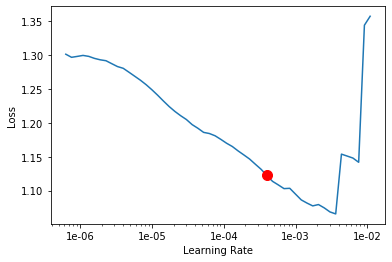

In [128]:
learn.recorder.plot(suggestion=True)

In [129]:
lr = 1e-3/2
learn.fit_one_cycle(10, max_lr=lr, 
                    callbacks=[
                        SaveModelCallback(learn,
                                         monitor='dice_multich',
                                         mode='max',
                                         name='znz001trn-focaldice-stage1-best')
                    ]
                   )

epoch,train_loss,valid_loss,acc_thresh_multich,dice_multich,acc_thresh_multich,dice_multich,time
0,0.927454,0.772365,0.962142,0.549955,0.934106,0.658676,00:19
1,0.782772,0.665077,0.957817,0.627651,0.935652,0.737255,00:17
2,0.707313,0.779676,0.938881,0.557115,0.888400,0.635042,00:17
3,0.623944,0.541973,0.969583,0.712171,0.952960,0.796043,00:17
4,0.578045,0.490885,0.974665,0.741715,0.961198,0.820916,00:17
5,0.533127,0.509494,0.972452,0.732695,0.964726,0.834404,00:17
6,0.505252,0.465239,0.975827,0.754330,0.962035,0.826128,00:17
7,0.466451,0.435478,0.979619,0.774740,0.969855,0.849237,00:17
8,0.453592,0.443448,0.978361,0.769487,0.969138,0.848821,00:17
9,0.443005,0.457975,0.976411,0.760729,0.965871,0.840442,00:17


Better model found at epoch 0 with dice_multich value: 0.6586756110191345.
Better model found at epoch 1 with dice_multich value: 0.7372546792030334.
Better model found at epoch 3 with dice_multich value: 0.7960432171821594.
Better model found at epoch 4 with dice_multich value: 0.8209158778190613.
Better model found at epoch 5 with dice_multich value: 0.8344038724899292.
Better model found at epoch 7 with dice_multich value: 0.8492370247840881.


In [130]:
learn.model.eval()
outputs,labels,losses = learn.get_preds(ds_type=DatasetType.Valid,n_batch=3,with_loss=True)
losses.shape

torch.Size([48, 1, 256, 256])

In [131]:
losses_reshaped = torch.mean(losses.view(outputs.shape[0],-1), dim=1)
sorted_idx = torch.argsort(losses_reshaped,descending=True)
losses_reshaped.shape

torch.Size([48])

znz001val_19_319365_270510.png
loss: 0.6085483431816101


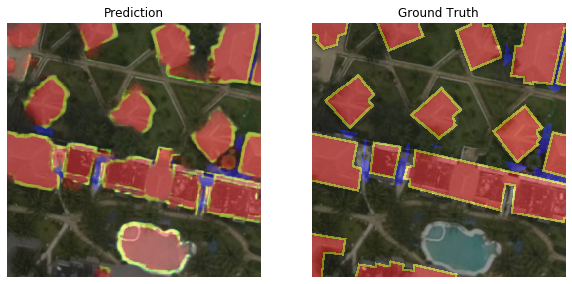

Predicted:


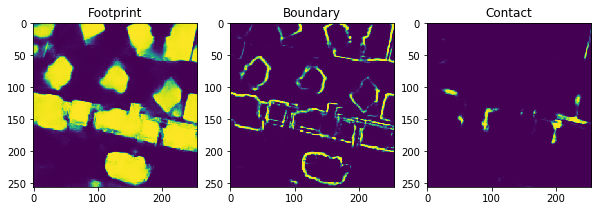

Actual:


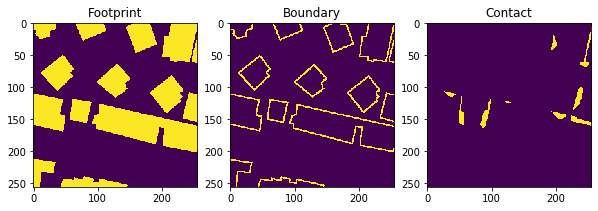

znz001val_19_319375_270510.png
loss: 0.6049631834030151


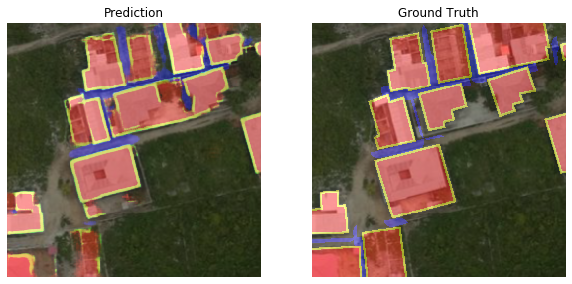

Predicted:


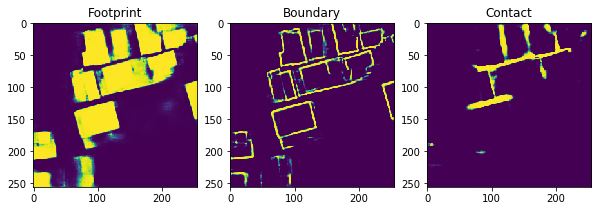

Actual:


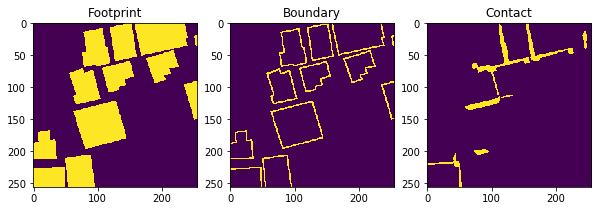

znz001val_19_319375_270506.png
loss: 0.6035954356193542


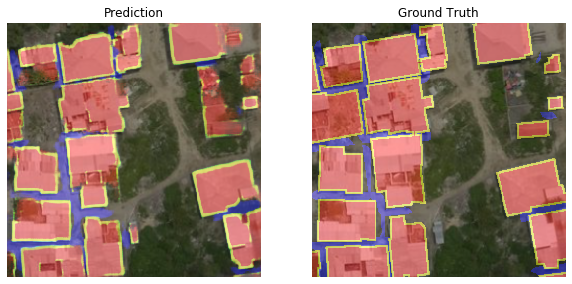

Predicted:


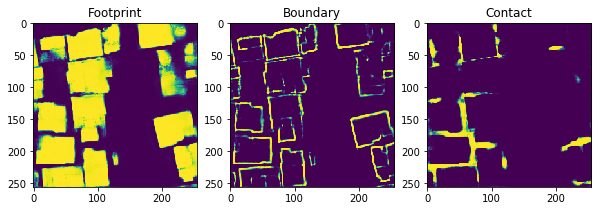

Actual:


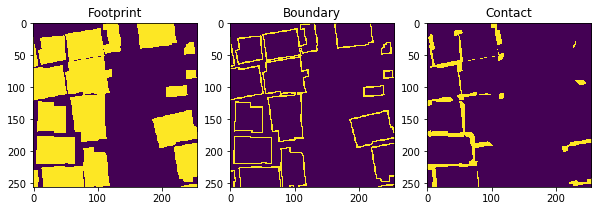

znz001val_19_319373_270501.png
loss: 0.5916768312454224


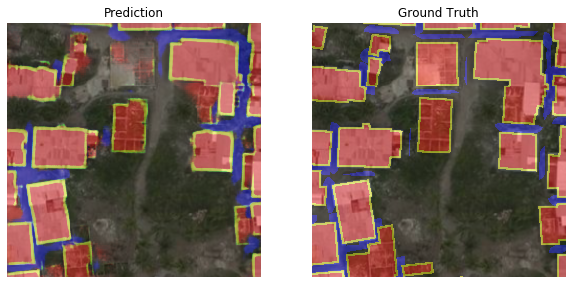

Predicted:


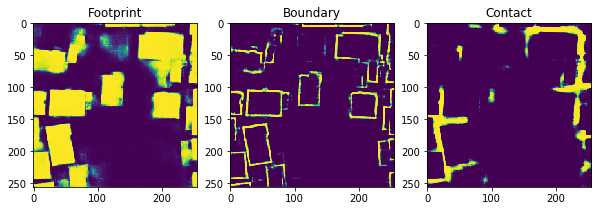

Actual:


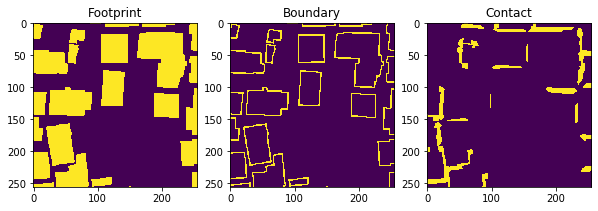

znz001val_19_319377_270506.png
loss: 0.5847943425178528


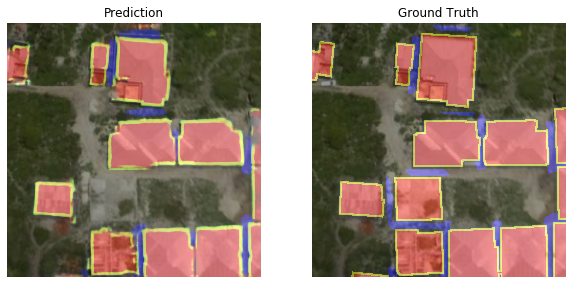

Predicted:


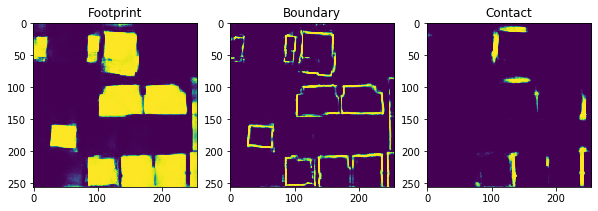

Actual:


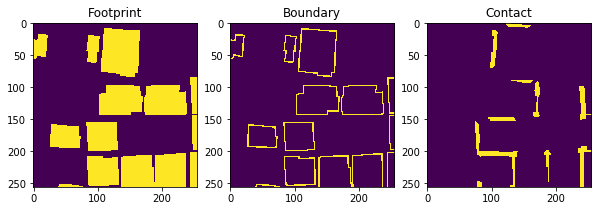

znz001val_19_319368_270496.png
loss: 0.5799427628517151


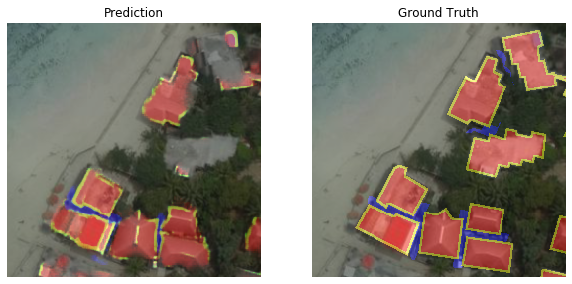

Predicted:


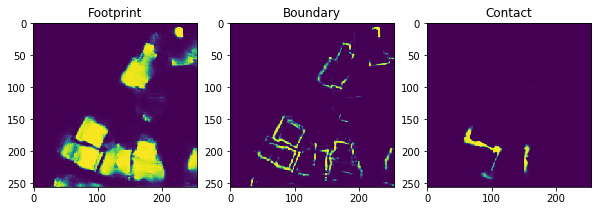

Actual:


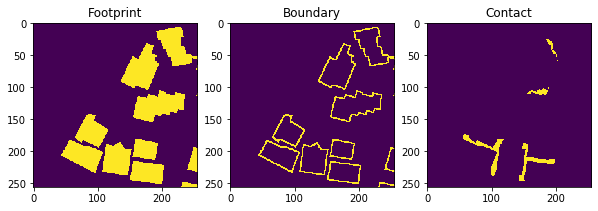

znz001val_19_319373_270504.png
loss: 0.5771992206573486


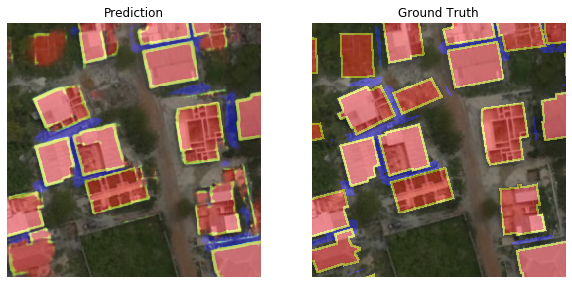

Predicted:


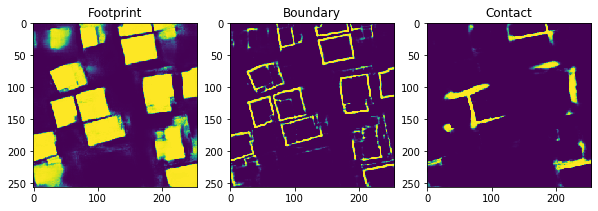

Actual:


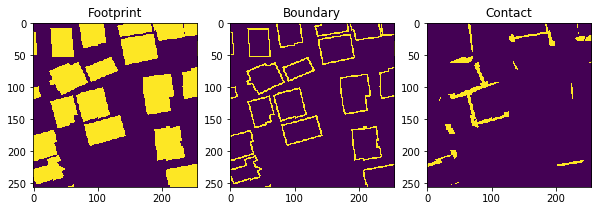

znz001val_19_319369_270496.png
loss: 0.5766870379447937


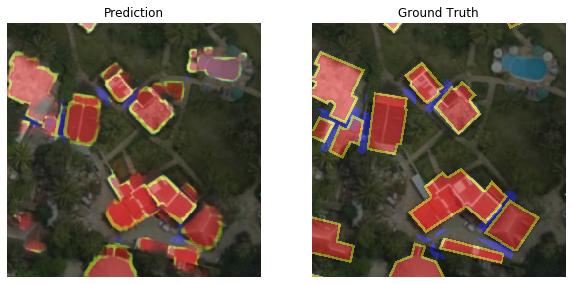

Predicted:


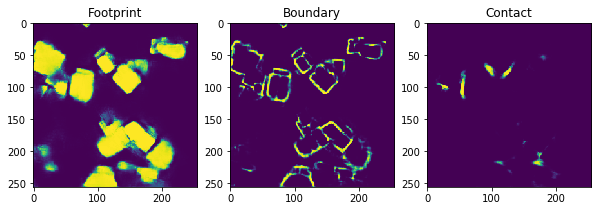

Actual:


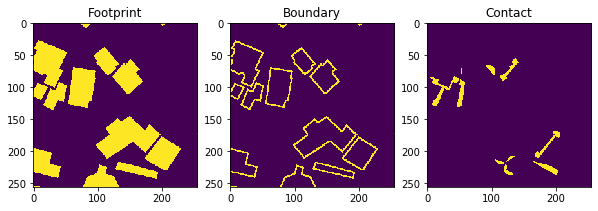

znz001val_19_319366_270500.png
loss: 0.5685528516769409


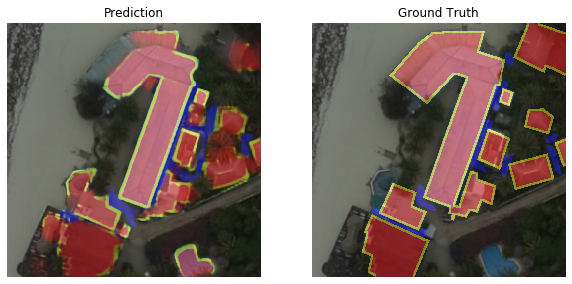

Predicted:


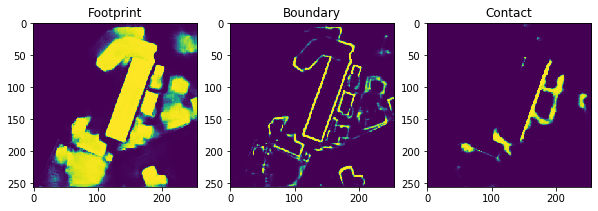

Actual:


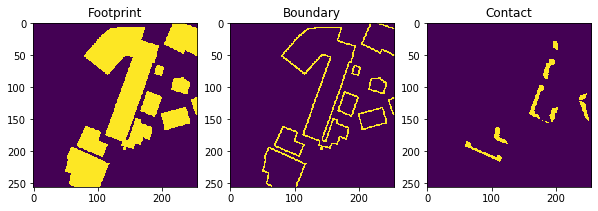

znz001val_19_319370_270500.png
loss: 0.5660701394081116


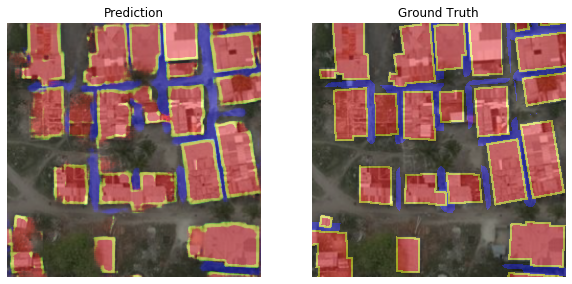

Predicted:


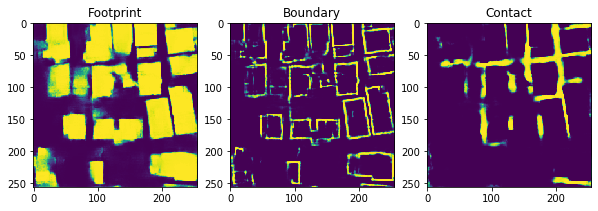

Actual:


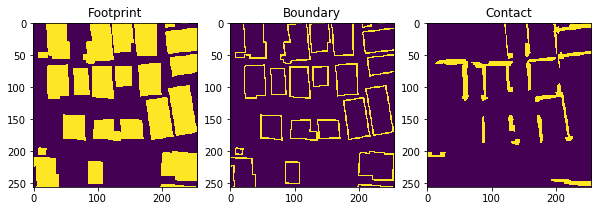

In [132]:
# look at predictions vs actual by channel sorted by highest image-wise loss first

for i in sorted_idx[:10]:

    print(f'{data.valid_ds.items[i].name}')
    print(f'loss: {losses_reshaped[i].mean()}')
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
    
    data.valid_ds.x[i].show(ax=ax1)
    ax1.set_title('Prediction')
    ax1.imshow(image2np(outputs[i].sigmoid()), alpha=0.4)
    
    ax2.set_title('Ground Truth')
    data.valid_ds.x[i].show(ax=ax2)
    ax2.imshow(image2np(labels[i])*255, alpha=0.4)
    plt.show()
    
    print('Predicted:')
    show_3ch(outputs[i].sigmoid())
    print('Actual:')
    show_3ch(labels[i])

In [133]:
learn.load('znz001trn-focaldice-stage1-best')
learn.model.train()
learn.unfreeze()

In [134]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 1.58E-06
Min loss divided by 10: 5.25E-06


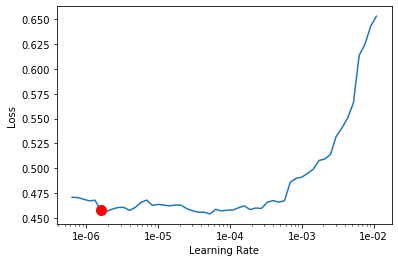

In [135]:
learn.recorder.plot(suggestion=True)

In [136]:
learn.fit_one_cycle(20, max_lr=slice(3e-6,3e-4), 
                    callbacks=[
                        SaveModelCallback(learn,
                                           monitor='dice_multich',
                                           mode='max',
                                           name='znz001trn-focaldice-unfrozen-best')
                    ]
                   )

epoch,train_loss,valid_loss,acc_thresh_multich,dice_multich,acc_thresh_multich,dice_multich,time
0,0.454030,0.439673,0.978401,0.771355,0.968667,0.848341,00:18
1,0.452478,0.450523,0.977318,0.766141,0.965894,0.840759,00:18
2,0.455268,0.438186,0.978570,0.771939,0.969554,0.850748,00:18
3,0.453310,0.469434,0.975957,0.756211,0.964686,0.835934,00:18
4,0.451725,0.502107,0.971705,0.733784,0.954378,0.805292,00:18
5,0.463199,0.447268,0.976942,0.764855,0.962924,0.831182,00:18
6,0.449557,0.439979,0.978847,0.776112,0.968624,0.849260,00:18
7,0.451605,0.428474,0.979776,0.775669,0.970757,0.851404,00:18
8,0.429460,0.438484,0.978429,0.776176,0.965078,0.840339,00:18
9,0.425319,0.418445,0.981166,0.783572,0.970902,0.850764,00:18


Better model found at epoch 0 with dice_multich value: 0.8483408093452454.
Better model found at epoch 2 with dice_multich value: 0.8507478833198547.
Better model found at epoch 7 with dice_multich value: 0.8514038324356079.
Better model found at epoch 13 with dice_multich value: 0.8577762842178345.
Better model found at epoch 15 with dice_multich value: 0.8618254661560059.
Better model found at epoch 17 with dice_multich value: 0.8631647825241089.
Better model found at epoch 18 with dice_multich value: 0.8636779189109802.


In [137]:
learn.model.eval()
outputs,labels,losses = learn.get_preds(ds_type=DatasetType.Valid,n_batch=6,with_loss=True)
losses_reshaped = torch.mean(losses.view(outputs.shape[0],-1), dim=1)
sorted_idx = torch.argsort(losses_reshaped,descending=True)

znz001val_19_319367_270502.png
loss: 0.7321900129318237


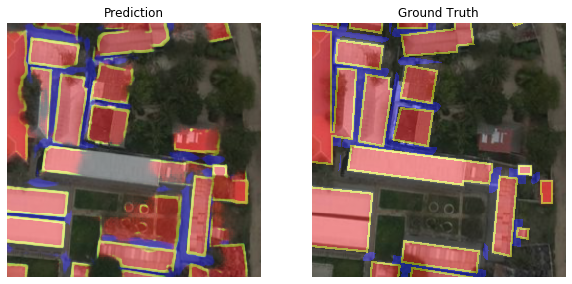

Predicted:


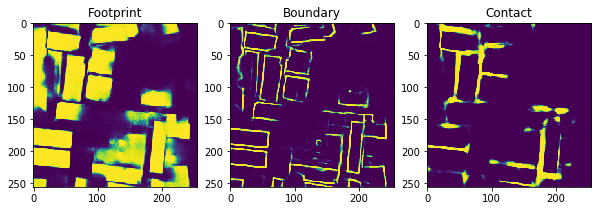

Actual:


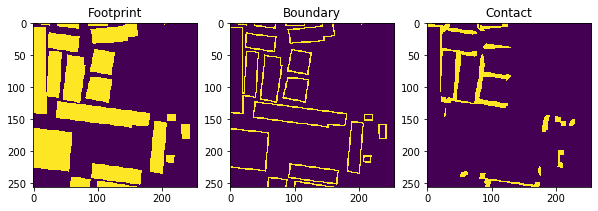

znz001val_19_319375_270501.png
loss: 0.6218385100364685


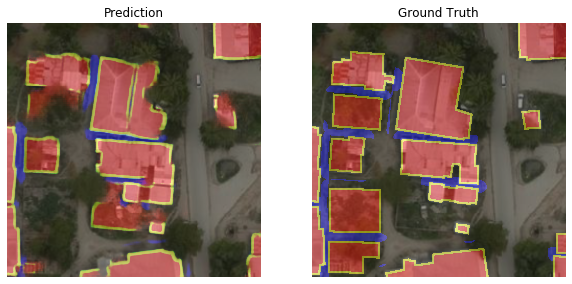

Predicted:


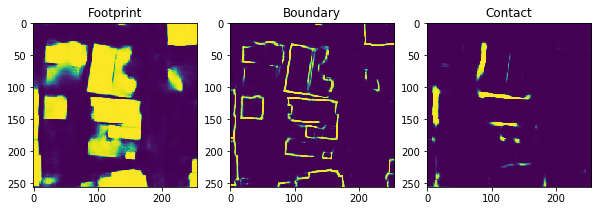

Actual:


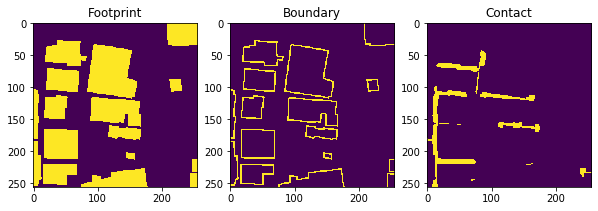

znz001val_19_319375_270510.png
loss: 0.5587548017501831


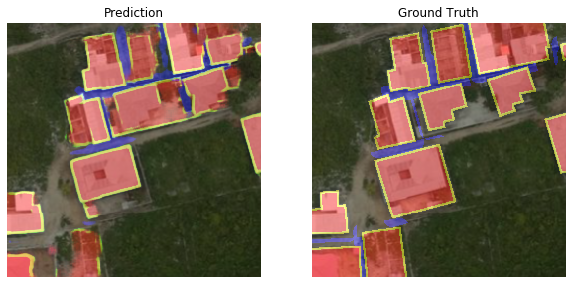

Predicted:


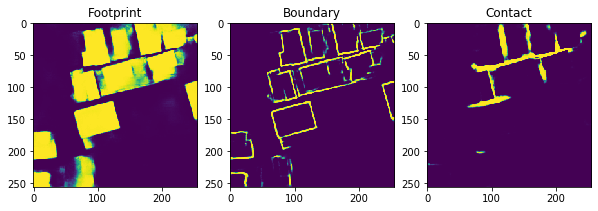

Actual:


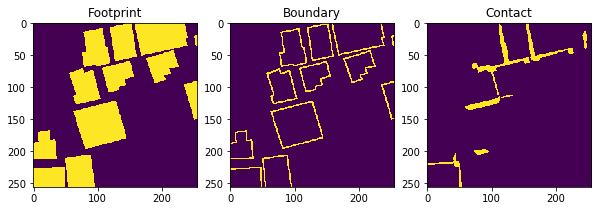

znz001val_19_319375_270506.png
loss: 0.5541567802429199


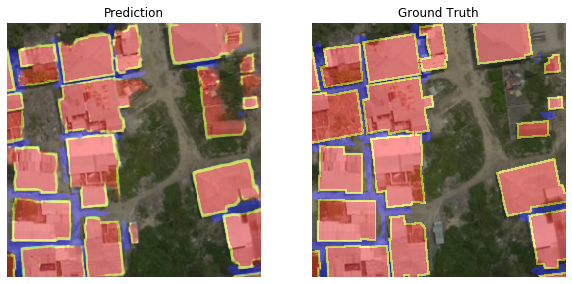

Predicted:


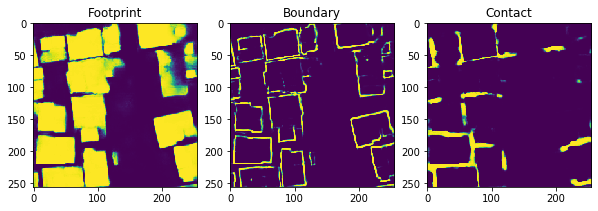

Actual:


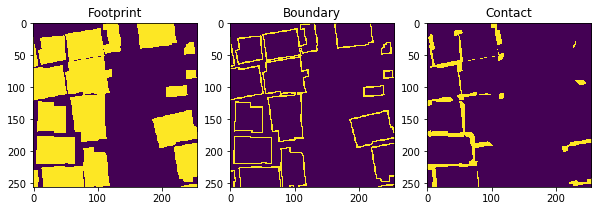

znz001val_19_319371_270499.png
loss: 0.5397445559501648


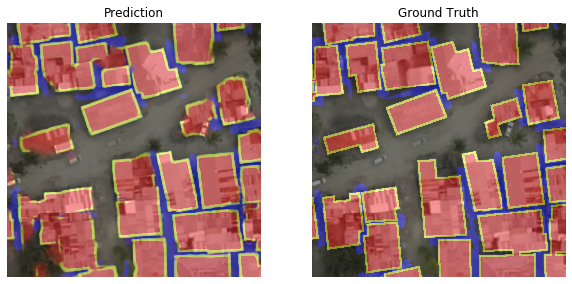

Predicted:


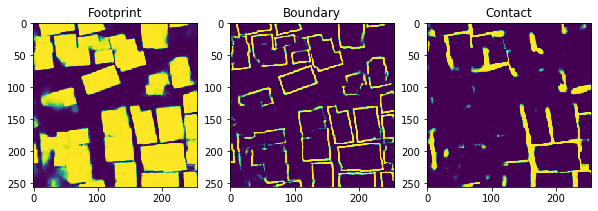

Actual:


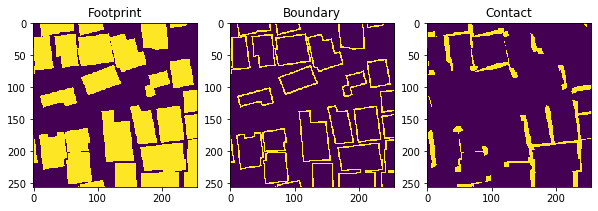

znz001val_19_319377_270506.png
loss: 0.5230021476745605


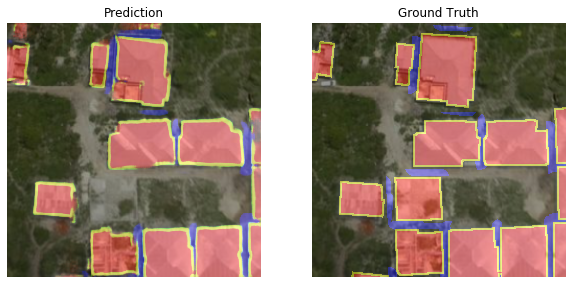

Predicted:


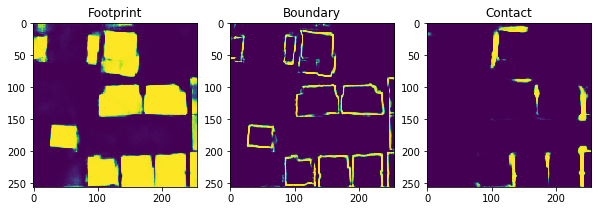

Actual:


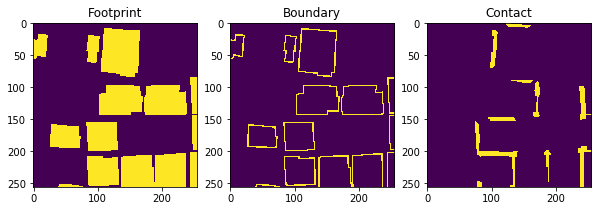

znz001val_19_319374_270506.png
loss: 0.5166671872138977


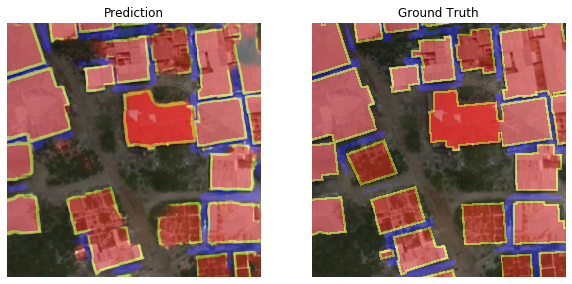

Predicted:


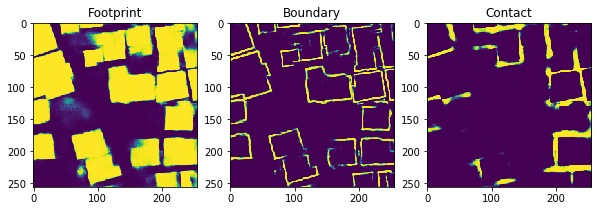

Actual:


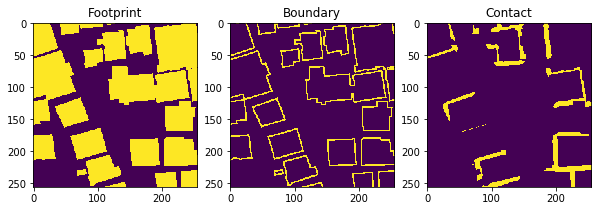

znz001val_19_319370_270500.png
loss: 0.5108723044395447


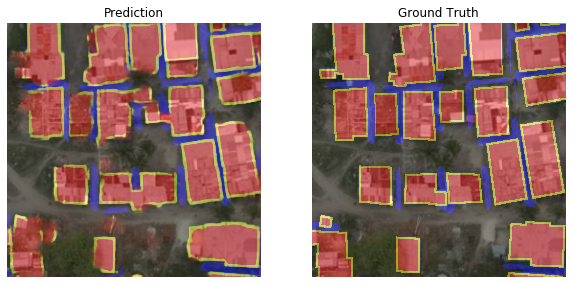

Predicted:


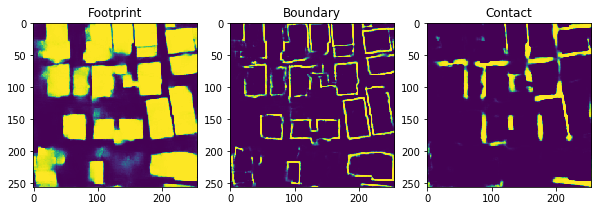

Actual:


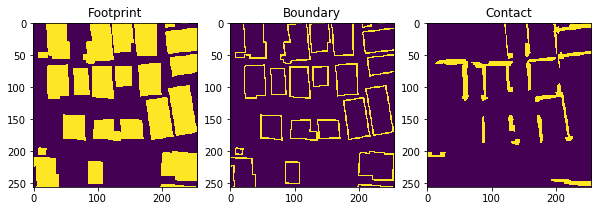

znz001val_19_319368_270497.png
loss: 0.5058225393295288


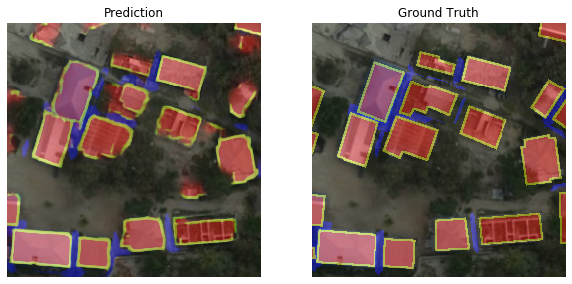

Predicted:


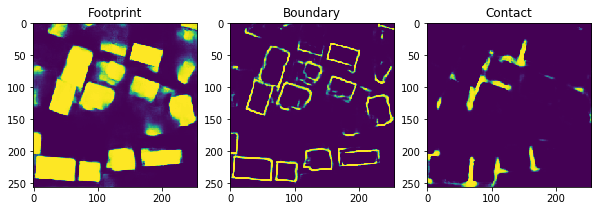

Actual:


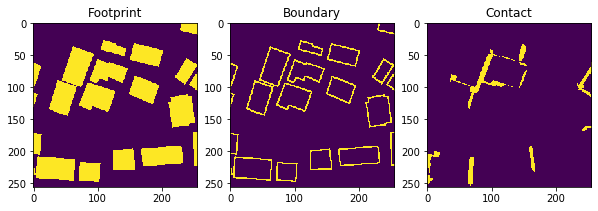

znz001val_19_319377_270511.png
loss: 0.5024394392967224


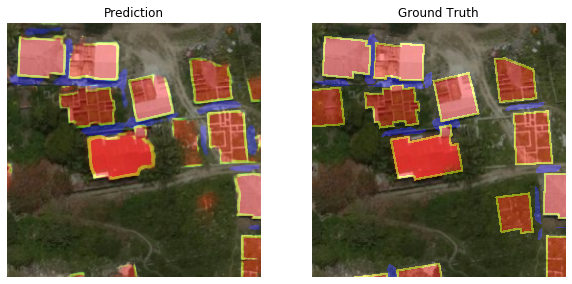

Predicted:


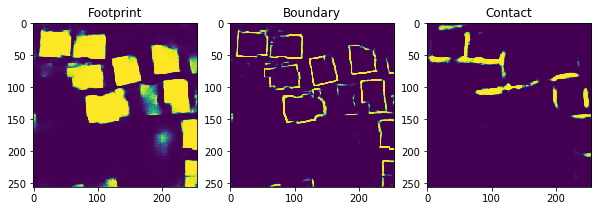

Actual:


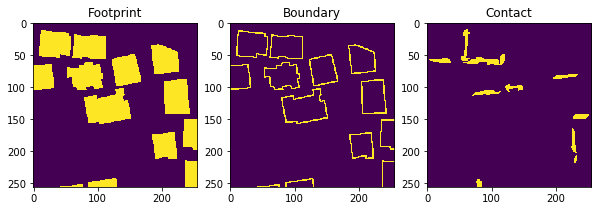

In [138]:
# look at predictions vs actual by channel sorted by highest image-wise loss first

for i in sorted_idx[:10]:

    print(f'{data.valid_ds.items[i].name}')
    print(f'loss: {losses_reshaped[i].mean()}')
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
    
    data.valid_ds.x[i].show(ax=ax1)
    ax1.set_title('Prediction')
    ax1.imshow(image2np(outputs[i].sigmoid()), alpha=0.4)
    
    ax2.set_title('Ground Truth')
    data.valid_ds.x[i].show(ax=ax2)
    ax2.imshow(image2np(labels[i])*255, alpha=0.4)
    plt.show()
    
    print('Predicted:')
    show_3ch(outputs[i].sigmoid())
    print('Actual:')
    show_3ch(labels[i])

In [142]:
# pickling with custom classes like MultiChComboLoss is a bit tricky 
learn.export('../../models/znz001trn-focaldice.pkl')

/opt/conda/lib/python3.6/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type MultiChComboLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.6/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type FocalLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.6/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type DiceLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


# Inference

In [143]:
inference_learner = load_learner(path='models/', file='znz001trn-focaldice.pkl')

In [144]:
import skimage 
import time

def get_pred(learner, tile):
#     pdb.set_trace()
    t_img = Image(pil2tensor(tile[:,:,:3],np.float32).div_(255))
    outputs = learner.predict(t_img)
    im = image2np(outputs[2].sigmoid())
    im = (im*255).astype('uint8')
    return im

In [145]:
# try a different tile by changing or adding your own urls to list

urls = [
  'https://tiles.openaerialmap.org/5b1009f22b6a08001185f24a/0/5b1009f22b6a08001185f24b/19/319454/270706.png',
  'https://tiles.openaerialmap.org/5b1e6fd42b6a08001185f7bf/0/5b1e6fd42b6a08001185f7c0/20/569034/537093.png',
  'https://tiles.openaerialmap.org/5beaaba463f9420005ef8db0/0/5beaaba463f9420005ef8db1/19/313479/283111.png',
  'https://tiles.openaerialmap.org/5d050c3673de290005853a91/0/5d050c3673de290005853a92/18/203079/117283.png',
  'https://tiles.openaerialmap.org/5c88ff77225fc20007ab4e26/0/5c88ff77225fc20007ab4e27/21/1035771/1013136.png',
  'https://tiles.openaerialmap.org/5d30bac2e757aa0005951652/0/5d30bac2e757aa0005951653/19/136700/197574.png'
]

https://tiles.openaerialmap.org/5b1009f22b6a08001185f24a/0/5b1009f22b6a08001185f24b/19/319454/270706.png
GPU inference took 0.32 secs


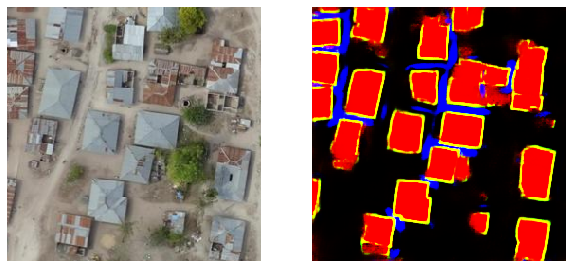

https://tiles.openaerialmap.org/5b1e6fd42b6a08001185f7bf/0/5b1e6fd42b6a08001185f7c0/20/569034/537093.png
GPU inference took 1.07 secs


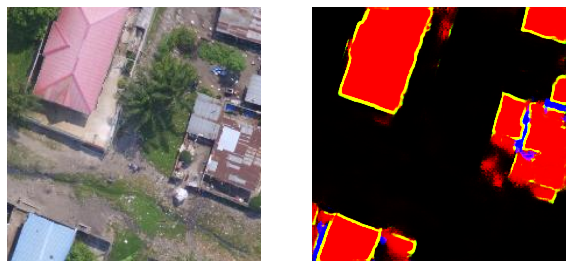

https://tiles.openaerialmap.org/5beaaba463f9420005ef8db0/0/5beaaba463f9420005ef8db1/19/313479/283111.png
GPU inference took 1.14 secs


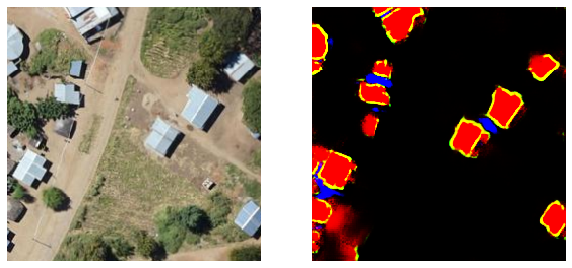

https://tiles.openaerialmap.org/5d050c3673de290005853a91/0/5d050c3673de290005853a92/18/203079/117283.png
GPU inference took 0.71 secs


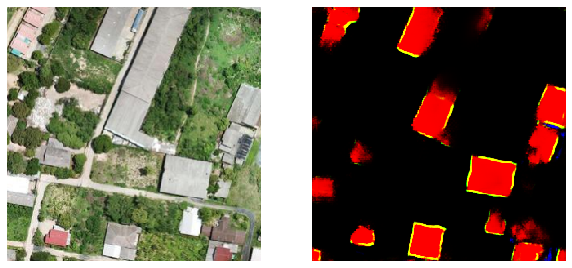

https://tiles.openaerialmap.org/5c88ff77225fc20007ab4e26/0/5c88ff77225fc20007ab4e27/21/1035771/1013136.png
GPU inference took 0.93 secs


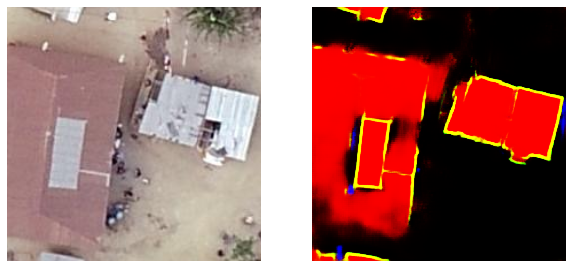

https://tiles.openaerialmap.org/5d30bac2e757aa0005951652/0/5d30bac2e757aa0005951653/19/136700/197574.png
GPU inference took 0.92 secs


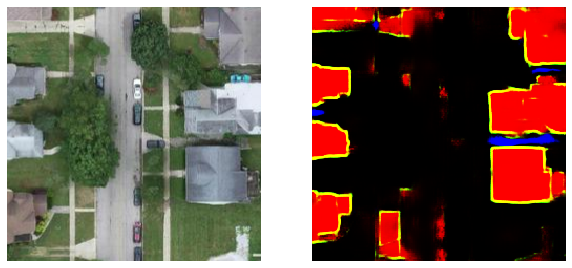

In [146]:
for url in urls:
    t1 = time.time()
    test_tile = skimage.io.imread(url)
    result = get_pred(inference_learner, test_tile)
    t2 = time.time()
  
    print(url)
    print(f'GPU inference took {t2-t1:.2f} secs')
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
    ax1.imshow(test_tile)
    ax2.imshow(result)
    ax1.axis('off')
    ax2.axis('off')
    plt.show();

In [147]:
import solaris as sol 
from affine import Affine
from rasterio.transform import from_bounds
from shapely.geometry import Polygon
import math
import geopandas as gpd
import skimage
  
def deg2num(lat_deg, lon_deg, zoom):
    lat_rad = math.radians(lat_deg)
    n = 2.0 ** zoom
    xtile = int((lon_deg + 180.0) / 360.0 * n)
    ytile = int((1.0 - math.log(math.tan(lat_rad) + (1 / math.cos(lat_rad))) / math.pi) / 2.0 * n)
    return (xtile, ytile)

def num2deg(xtile, ytile, zoom):
    n = 2.0 ** zoom
    lon_deg = xtile / n * 360.0 - 180.0
    lat_rad = math.atan(math.sinh(math.pi * (1 - 2 * ytile / n)))
    lat_deg = math.degrees(lat_rad)
    return (lat_deg, lon_deg)
  
def tile_to_poly(z,x,y, size):
    top, left = num2deg(x, y, z)
    bottom, right = num2deg(x+1, y+1, z)
    tfm = from_bounds(left, bottom, right, top, size, size)

    return Polygon.from_bounds(left,top,right,bottom), tfm

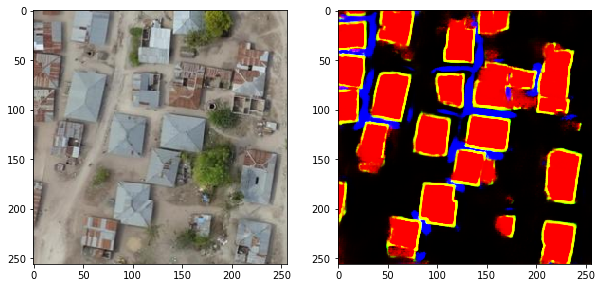

In [148]:
z,x,y = 19,319454,270706
url= 'https://tiles.openaerialmap.org/5b1009f22b6a08001185f24a/0/5b1009f22b6a08001185f24b/19/319454/270706.png'

test_tile = skimage.io.imread(url)
result = get_pred(inference_learner, test_tile)
  
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
ax1.imshow(test_tile)
ax2.imshow(result)
plt.show()

In [149]:
# threshold and polygonize with solaris: https://solaris.readthedocs.io/en/latest/tutorials/notebooks/api_mask_to_vector.html

mask2poly = sol.vector.mask.mask_to_poly_geojson(result, 
                                                 channel_scaling=[1,0,-1], 
                                                 bg_threshold=245, 
                                                 simplify=True,
                                                 tolerance=2
                                                 )

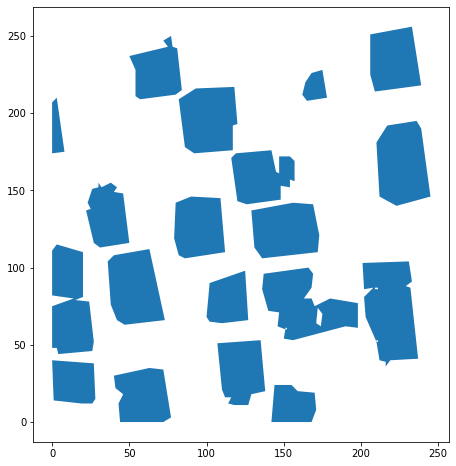

In [151]:
mask2poly.plot(figsize=(8,8))

In [152]:
mask2poly.head()

,geometry,value
0,"POLYGON ((142 0, 144 24, 155 24, 159 20, 170 1...",255.0
1,"POLYGON ((44 0, 43 12, 46 18, 41 22, 40 30, 63...",255.0
2,"POLYGON ((19 12, 1 14, 0 40, 27 38, 28 15, 26 ...",255.0
3,"POLYGON ((118 11, 114 12, 116 16, 112 16, 110 ...",255.0
4,"POLYGON ((110 64, 102 65, 100 68, 102 90, 125 ...",255.0


In [153]:
# get the bounds of the tile and its affine tfm matrix for georegistering purposes
tile_poly, tile_tfm = tile_to_poly(z,x,y,256)
tile_tfm

Affine(2.682209014892578e-06, 0.0, 39.351654052734375,
       0.0, -2.6681491150752634e-06, -5.868769539456524)

In [154]:
# convert polys from pixel coords to geo coords: https://solaris.readthedocs.io/en/latest/api/vector.html?highlight=georegister_px_df#solaris.vector.polygon.georegister_px_df
result_polys = sol.vector.polygon.georegister_px_df(mask2poly, 
                                                   affine_obj=tile_tfm, 
                                                   crs='epsg:4326')

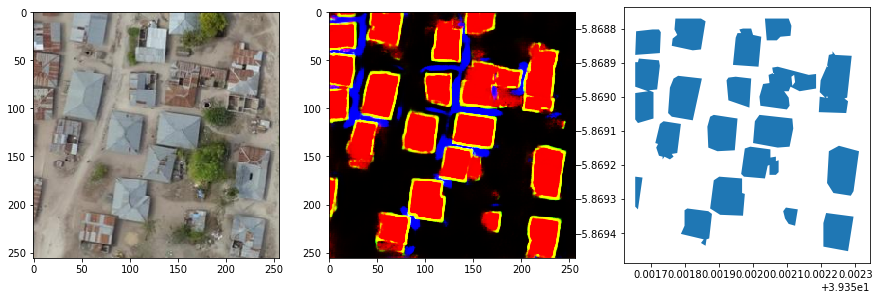

In [155]:
# show tile image to raw prediction to georegistered polygons
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15,5))

ax1.imshow(test_tile)
ax2.imshow(result)
result_polys.plot(ax=ax3)

In [156]:
result_polys.to_file('result_polys.geojson', driver='GeoJSON')

In [157]:
# get the ground truth labels for all znz029
labels_url = 'https://www.dropbox.com/sh/ct3s1x2a846x3yl/AADHytc8fSCf3gna0wNAW3lZa/grid_029.geojson?dl=1'

gt_gdf = gpd.read_file(labels_url)

In [158]:
print(tile_poly.bounds)

(39.351654052734375, -5.8694525856299835, 39.35234069824219, -5.868769539456524)


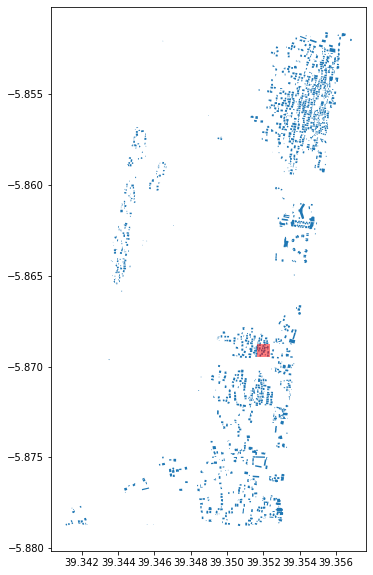

In [160]:
# visualize the tile (in red) against the entire labeled znz029 area (in blue)
fig, ax = plt.subplots(figsize=(10,10))
gt_gdf.plot(ax=ax)
gpd.GeoDataFrame(geometry=[tile_poly], crs='epsg:4326').plot(alpha=0.5, color='red', ax=ax);

In [161]:
# clip gt_gdf to the tile bounds
clipped_gt_polys = gpd.overlay(gt_gdf, gpd.GeoDataFrame(geometry=[tile_poly], crs='epsg:4326'), how='intersection')

/opt/conda/lib/python3.6/site-packages/geopandas/base.py:29: UserWarning: GeoSeries crs mismatch: {'init': 'epsg:4326'} and epsg:4326
  other.crs))


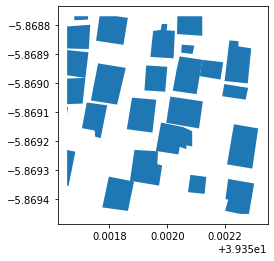

In [163]:
clipped_gt_polys.plot();

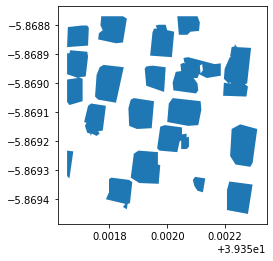

In [164]:
result_polys.plot();

In [165]:
clipped_gt_polys.to_file('clipped_gt_polys.geojson', driver='GeoJSON')

In [166]:
# solaris tutorial on evaluation: https://solaris.readthedocs.io/en/latest/tutorials/notebooks/api_evaluation_tutorial.html 
evaluator = sol.eval.base.Evaluator('clipped_gt_polys.geojson')
evaluator.load_proposal('result_polys.geojson', proposalCSV=False, conf_field_list=[])
evaluator.eval_iou(calculate_class_scores=False)

19it [00:00, 212.87it/s]


[{'class_id': 'all',
  'iou_field': 'iou_score_all',
  'TruePos': 18,
  'FalsePos': 1,
  'FalseNeg': 7,
  'Precision': 0.9473684210526315,
  'Recall': 0.72,
  'F1Score': 0.8181818181818181}]

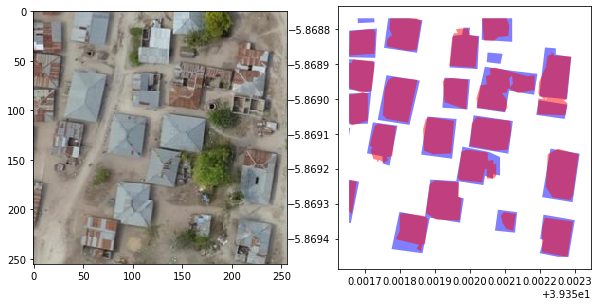

In [167]:
# visualize predicted vs ground truth
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))

ax1.imshow(test_tile)
clipped_gt_polys.plot(ax=ax2, color='blue', alpha=0.5) #gt
result_polys.plot(ax=ax2, color='red', alpha=0.5) #pred